In [1]:
%load_ext autoreload
%reload_ext tensorboard
%autoreload 2

In [2]:
import config
import torch
import torch.optim as optim

from model import s13Model, PrintCallback #YOLOv3
from tqdm import tqdm
from utils import (
    mean_average_precision,
    cells_to_bboxes,
    get_evaluation_bboxes,
    save_checkpoint,
    load_checkpoint,
    check_class_accuracy,
    get_loaders,
    plot_couple_examples
)
from loss import YoloLoss
import warnings
warnings.filterwarnings("ignore")
from pytorch_lightning import LightningModule, Trainer

In [3]:
AVAIL_GPUS = min(1, torch.cuda.device_count())
AVAIL_GPUS

1

In [4]:
### This cell has training until the 6th epoch..Had to stop and restart in the next cell 
### to enable 75% only mosaic augmentations and some progress bar fix it stays in single line!

from pytorch_lightning.callbacks import ModelSummary
from pytorch_lightning.callbacks import LearningRateMonitor
lr_monitor = LearningRateMonitor(logging_interval='step')

max_epochs = 40
# model = s10Model(steps_per_epoch= len(train_loader), max_epochs=max_epochs)
model = s13Model(num_classes=config.NUM_CLASSES, multi_scale=True)

trainer = Trainer(
    callbacks=[ModelSummary(max_depth=-1), lr_monitor, PrintCallback()],
#     default_root_dir="/home/sn/ERAv1/checkpoints/",
    enable_checkpointing=True,
    precision=16,
    devices=AVAIL_GPUS, 
    max_epochs=max_epochs,
    log_every_n_steps=500,
    # fast_dev_run=4
) 

train_loader, test_loader, train_eval_loader = get_loaders(
    train_csv_path=config.DATASET + "/train.csv", test_csv_path=config.DATASET + "/test.csv"
)

# if config.LOAD_MODEL:
#     load_checkpoint(
#         config.CHECKPOINT_FILE, model, optimizer, config.LEARNING_RATE
#     )

#,    enable_progress_bar=True)# progress_bar_refresh_rate=10)
#     gpus = AVAIL_GPUS,
#     max_epochs = 3,
#     progress_bar_refresh_rate=10
# )


Using 16bit Automatic Mixed Precision (AMP)
Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
Loading `train_dataloader` to estimate number of stepping batches.

    | Name                       | Type              | Params
-------------------------------------------------------------------
0   | loss_fn                    | YoloLoss          | 0     
1   | loss_fn.mse                | MSELoss           | 0     
2   | loss_fn.bce                | BCEWithLogitsLoss | 0     
3   | loss_fn.entropy            | CrossEntropyLoss  | 0     
4   | loss_fn.sigmoid            | Sigmoid           | 0     
5   | layers                     | ModuleList        | 61.6 M
6   | layers.0                   | CNNBlock          | 928   
7   | layers.0.conv              | Conv2d            | 864   
8   | layers.0.bn                | BatchNorm2d       | 64    
9   | layers.0.leaky             | LeakyReLU         | 0     
10  | layers.1                   | CNNBlock          | 18.6 K
11  | layers.1.conv              | Conv2d            | 18.4 K
12  | layers.1

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch: 0, Train Loss: 12.8795


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 33.944862%
No obj accuracy is: 95.023399%
Obj accuracy is: 8.171456%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 1, Train Loss: 12.0906


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 35.912411%
No obj accuracy is: 99.999565%
Obj accuracy is: 0.009542%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 2, Train Loss: 10.5273


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 34.402370%
No obj accuracy is: 99.548019%
Obj accuracy is: 8.643859%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 3, Train Loss: 9.9835


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 41.844692%
No obj accuracy is: 98.662689%
Obj accuracy is: 18.664751%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 4, Train Loss: 10.5593


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 37.228325%
No obj accuracy is: 98.328224%
Obj accuracy is: 22.961920%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 5, Train Loss: 9.9454


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 43.702446%
No obj accuracy is: 98.194794%
Obj accuracy is: 28.835110%
Validation Loss: 12.3459


  0%|          | 0/310 [00:00<?, ?it/s]

Class accuracy is: 47.108616%
No obj accuracy is: 97.834366%
Obj accuracy is: 29.890049%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 6, Train Loss: 10.4864


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 41.373699%
No obj accuracy is: 97.352875%
Obj accuracy is: 35.914783%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 7, Train Loss: 9.3699


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 46.728634%
No obj accuracy is: 98.256775%
Obj accuracy is: 33.989044%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 8, Train Loss: 8.3843


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 50.161869%
No obj accuracy is: 97.163139%
Obj accuracy is: 47.763844%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 9, Train Loss: 10.1293


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 46.263428%
No obj accuracy is: 97.533073%
Obj accuracy is: 45.431431%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 10, Train Loss: 8.1969


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 47.672005%
No obj accuracy is: 98.228661%
Obj accuracy is: 42.871166%
Validation Loss: 11.0372


  0%|          | 0/310 [00:00<?, ?it/s]

Class accuracy is: 49.409611%
No obj accuracy is: 97.864700%
Obj accuracy is: 43.849258%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 11, Train Loss: 8.1106


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 53.584171%
No obj accuracy is: 97.888466%
Obj accuracy is: 47.281239%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 12, Train Loss: 10.0028


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 54.407574%
No obj accuracy is: 97.377533%
Obj accuracy is: 55.595940%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 13, Train Loss: 8.1784


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 55.819141%
No obj accuracy is: 97.770866%
Obj accuracy is: 53.023743%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 14, Train Loss: 7.0191


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 56.951992%
No obj accuracy is: 98.272835%
Obj accuracy is: 46.808937%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 15, Train Loss: 7.3290


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 60.051380%
No obj accuracy is: 98.069366%
Obj accuracy is: 53.354858%
Validation Loss: 9.7651


  0%|          | 0/310 [00:00<?, ?it/s]

Class accuracy is: 66.306236%
No obj accuracy is: 97.710197%
Obj accuracy is: 54.387875%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 16, Train Loss: 5.7537


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 62.153263%
No obj accuracy is: 98.047462%
Obj accuracy is: 56.486015%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 17, Train Loss: 6.1935


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 64.808235%
No obj accuracy is: 97.792320%
Obj accuracy is: 59.282463%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 18, Train Loss: 6.3245


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 63.820087%
No obj accuracy is: 97.593750%
Obj accuracy is: 60.202034%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 19, Train Loss: 6.1442


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 64.222046%
No obj accuracy is: 97.950485%
Obj accuracy is: 60.178288%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 20, Train Loss: 7.8895


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 67.864288%
No obj accuracy is: 98.157204%
Obj accuracy is: 59.382694%
Validation Loss: 8.0051


  0%|          | 0/310 [00:00<?, ?it/s]

Class accuracy is: 73.567329%
No obj accuracy is: 97.826500%
Obj accuracy is: 60.817600%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 21, Train Loss: 7.9664


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 67.977028%
No obj accuracy is: 97.398697%
Obj accuracy is: 64.489243%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 22, Train Loss: 7.1310


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 70.505936%
No obj accuracy is: 97.940338%
Obj accuracy is: 63.537441%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 23, Train Loss: 8.3452


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 69.544998%
No obj accuracy is: 98.042580%
Obj accuracy is: 60.483749%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 24, Train Loss: 8.1649


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 71.413406%
No obj accuracy is: 97.910942%
Obj accuracy is: 62.950619%
Creating Checkpoint..


Validation: 0it [00:00, ?it/s]

Epoch: 25, Train Loss: 5.8469


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 71.127251%
No obj accuracy is: 98.040001%
Obj accuracy is: 64.536873%
Validation Loss: 7.7511


  0%|          | 0/310 [00:00<?, ?it/s]

Class accuracy is: 76.812775%
No obj accuracy is: 97.955124%
Obj accuracy is: 63.181496%
Creating Checkpoint..


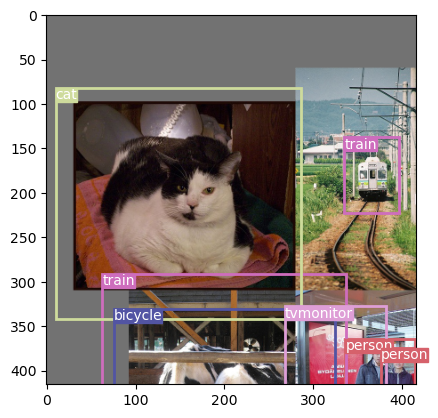

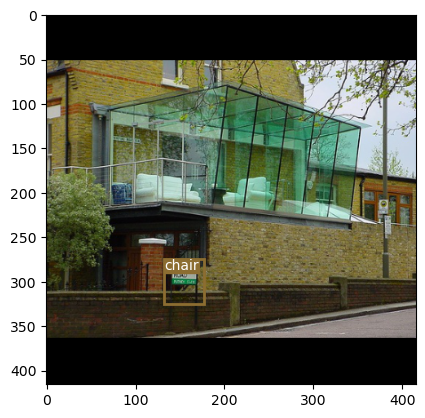

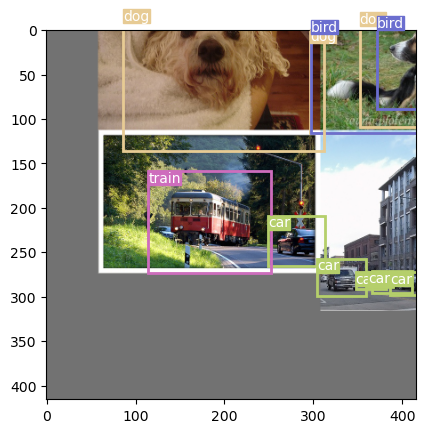

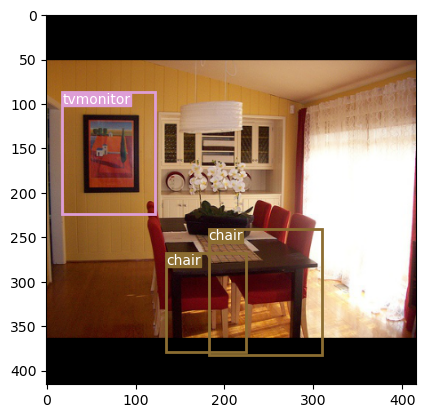

Validation: 0it [00:00, ?it/s]

Epoch: 26, Train Loss: 5.8002


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 72.237953%
No obj accuracy is: 97.855034%
Obj accuracy is: 66.142593%
Creating Checkpoint..


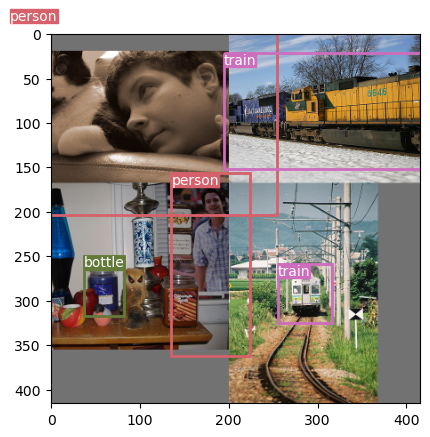

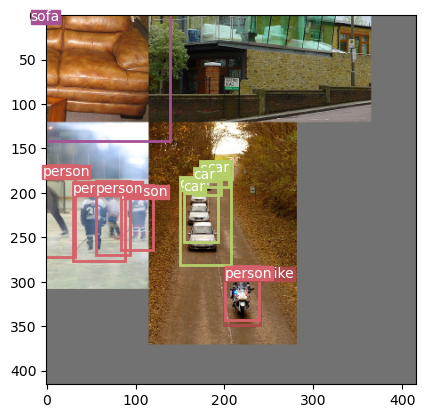

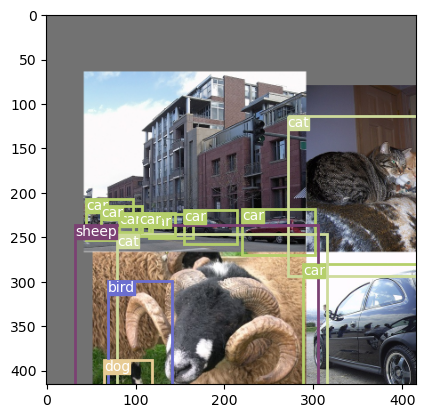

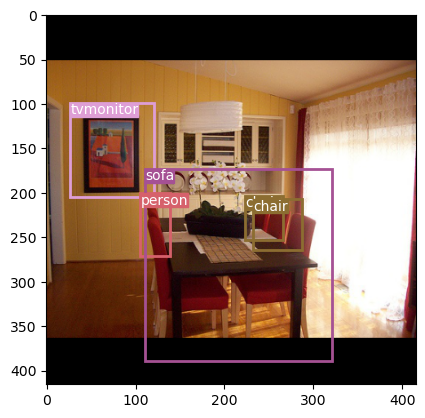

Validation: 0it [00:00, ?it/s]

Epoch: 27, Train Loss: 6.8028


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 73.176743%
No obj accuracy is: 97.750938%
Obj accuracy is: 67.418083%
Creating Checkpoint..


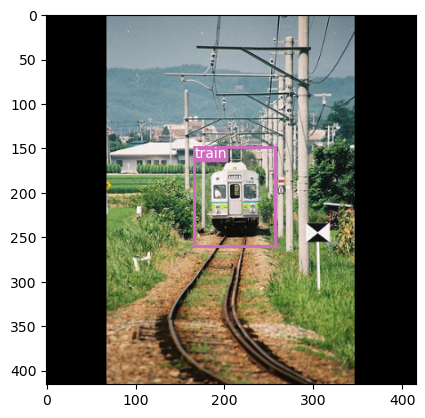

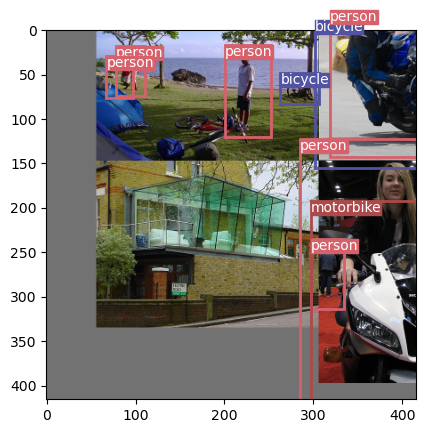

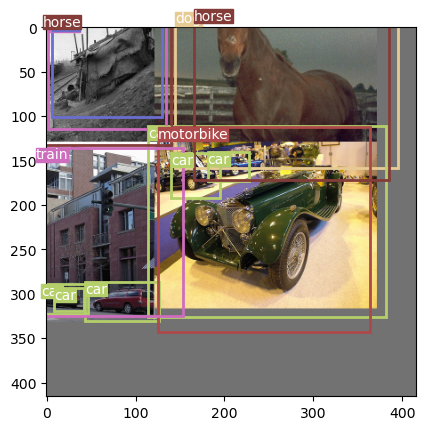

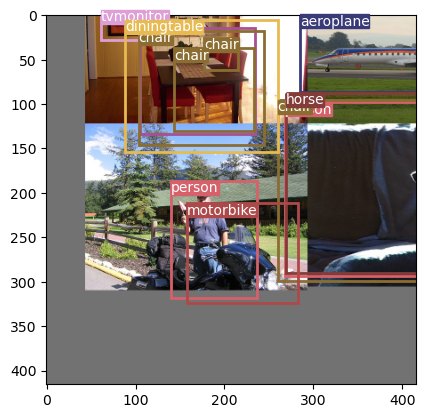

Validation: 0it [00:00, ?it/s]

Epoch: 28, Train Loss: 7.2556


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 75.073669%
No obj accuracy is: 97.808609%
Obj accuracy is: 69.296501%
Creating Checkpoint..


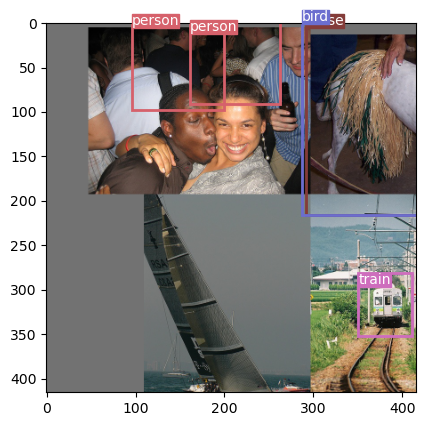

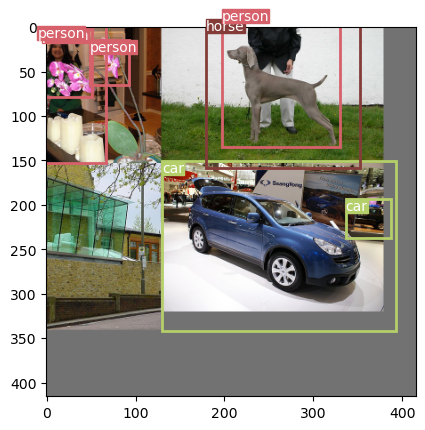

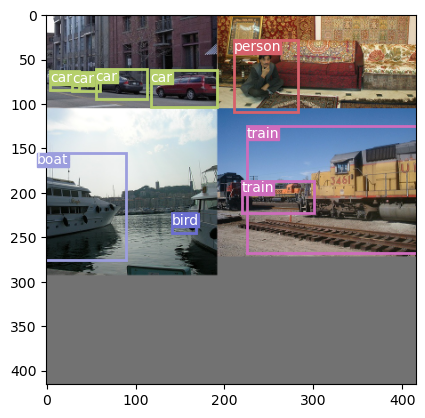

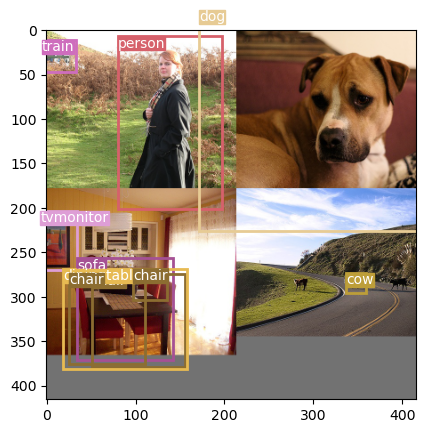

Validation: 0it [00:00, ?it/s]

Epoch: 29, Train Loss: 4.4362


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 75.314743%
No obj accuracy is: 97.856224%
Obj accuracy is: 70.160606%
Creating Checkpoint..


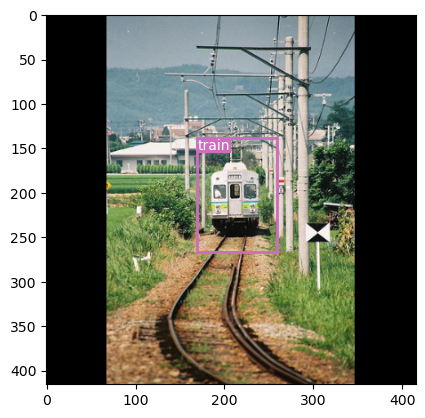

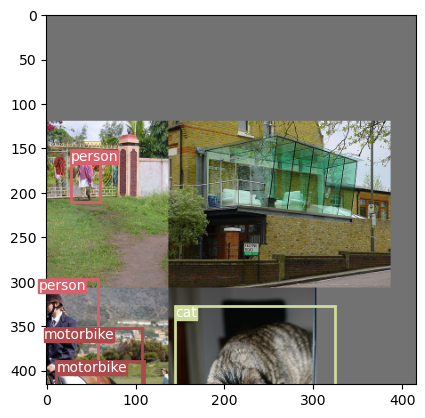

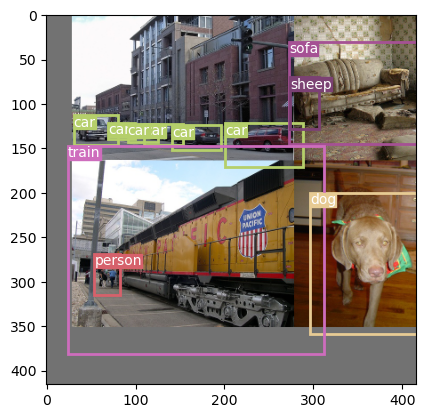

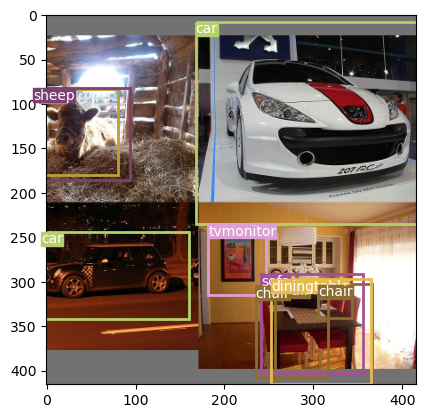

Validation: 0it [00:00, ?it/s]

Epoch: 30, Train Loss: 4.7220


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 76.553879%
No obj accuracy is: 97.961250%
Obj accuracy is: 69.660400%
Validation Loss: 6.8744


  0%|          | 0/310 [00:00<?, ?it/s]

Class accuracy is: 79.287163%
No obj accuracy is: 97.834030%
Obj accuracy is: 68.614433%
Creating Checkpoint..


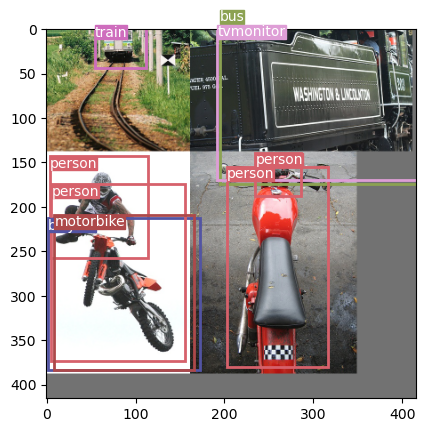

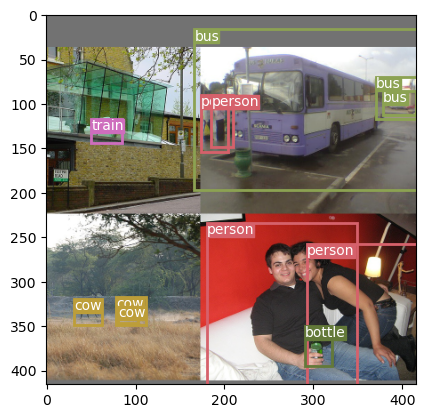

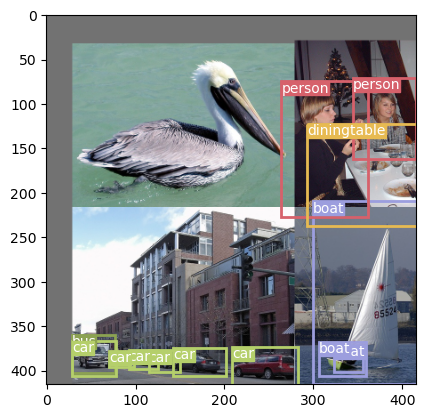

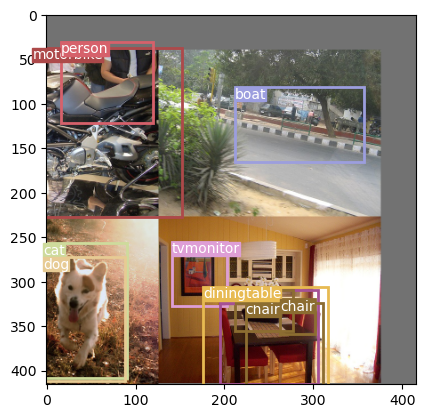

Validation: 0it [00:00, ?it/s]

Epoch: 31, Train Loss: 6.3748


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 76.771805%
No obj accuracy is: 97.880600%
Obj accuracy is: 68.547707%
Creating Checkpoint..


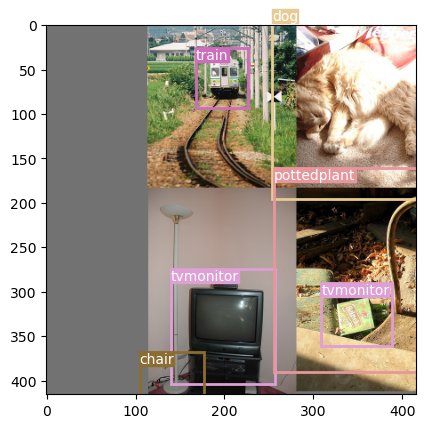

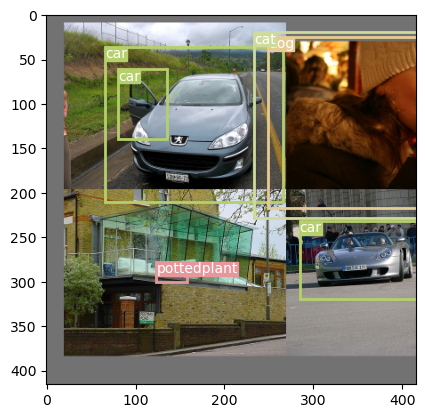

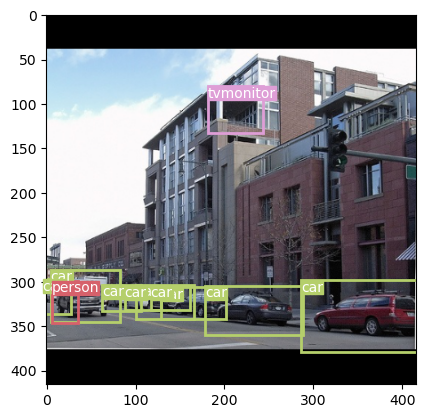

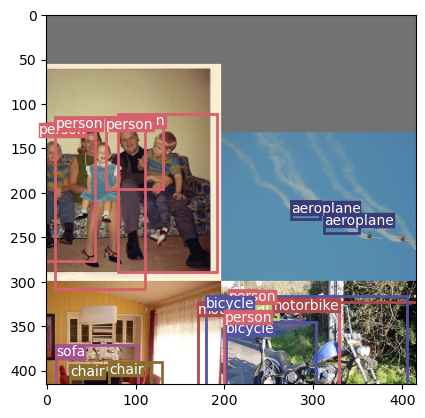

Validation: 0it [00:00, ?it/s]

Epoch: 32, Train Loss: 5.4857


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 77.228607%
No obj accuracy is: 97.723846%
Obj accuracy is: 70.486572%
Creating Checkpoint..


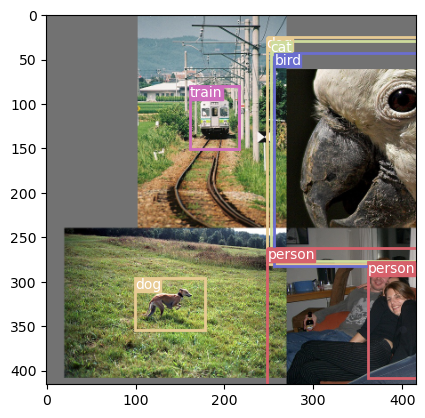

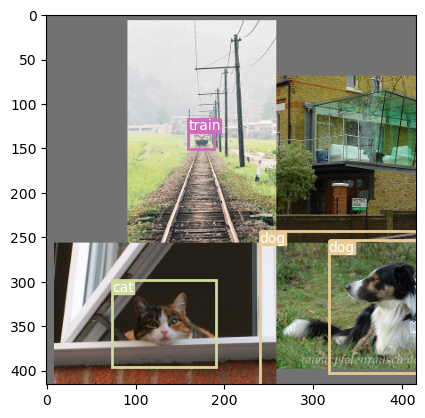

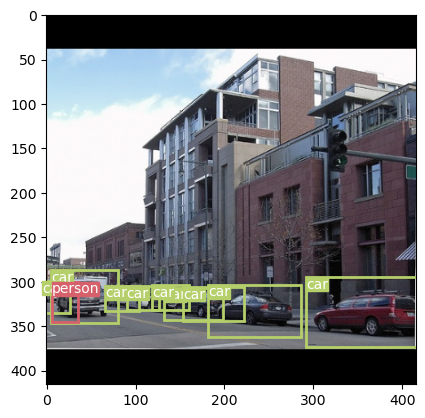

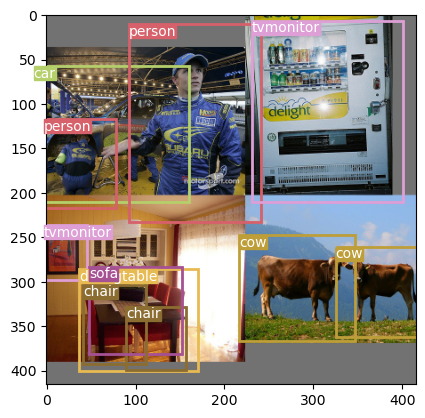

Validation: 0it [00:00, ?it/s]

Epoch: 33, Train Loss: 5.3467


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 78.642014%
No obj accuracy is: 97.833923%
Obj accuracy is: 71.685349%
Creating Checkpoint..


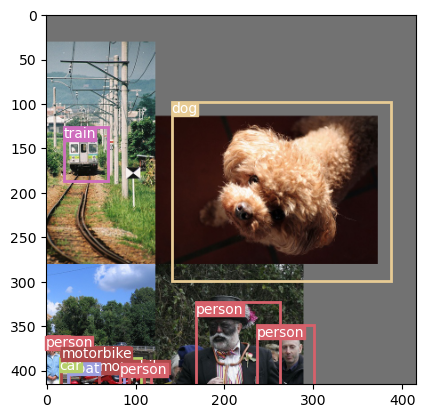

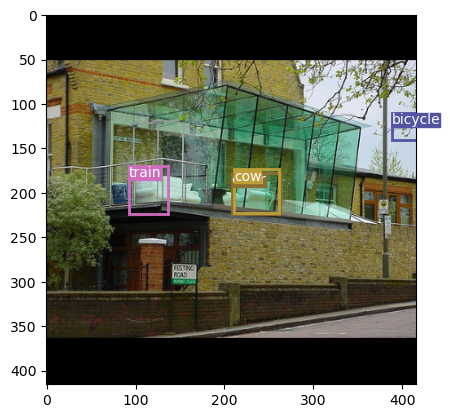

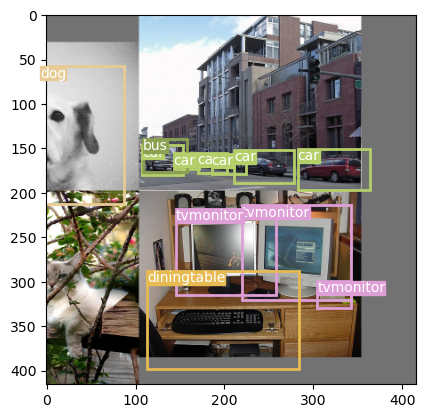

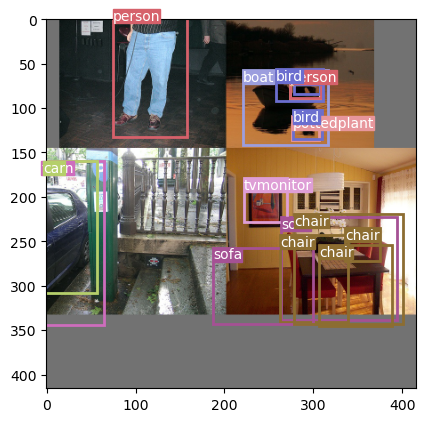

Validation: 0it [00:00, ?it/s]

Epoch: 34, Train Loss: 6.2665


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 79.728462%
No obj accuracy is: 97.883644%
Obj accuracy is: 73.036041%
Creating Checkpoint..


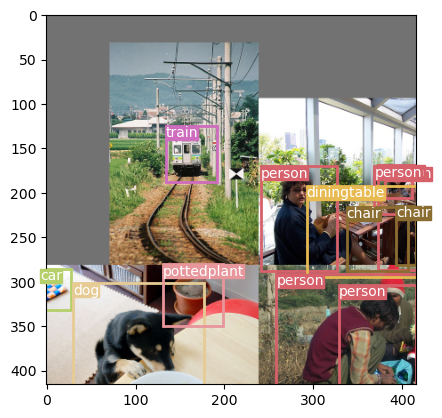

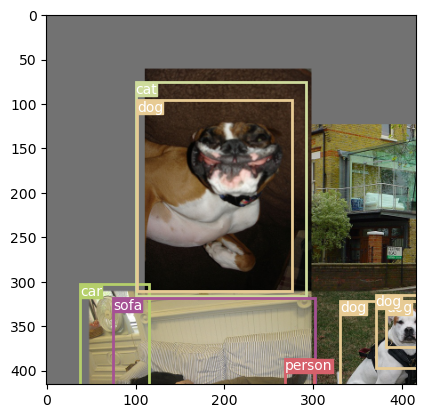

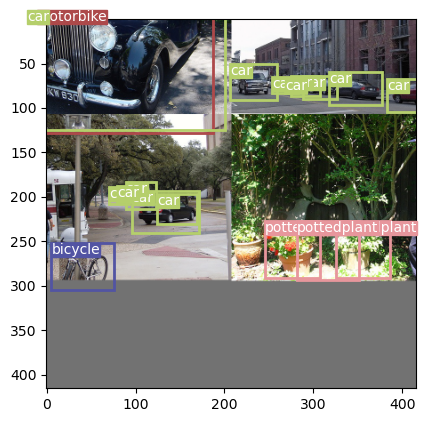

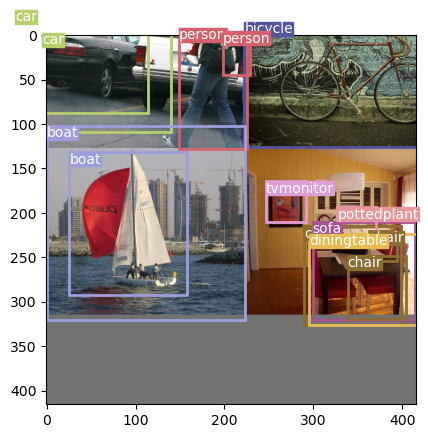

Validation: 0it [00:00, ?it/s]

Epoch: 35, Train Loss: 4.6928


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 79.817116%
No obj accuracy is: 98.032600%
Obj accuracy is: 68.853706%
Validation Loss: 6.5257


  0%|          | 0/310 [00:00<?, ?it/s]

Class accuracy is: 81.979134%
No obj accuracy is: 97.972191%
Obj accuracy is: 68.452995%
Creating Checkpoint..


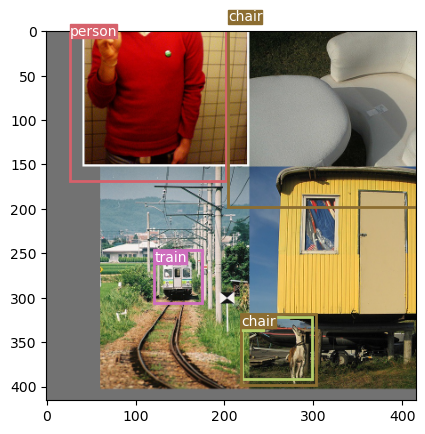

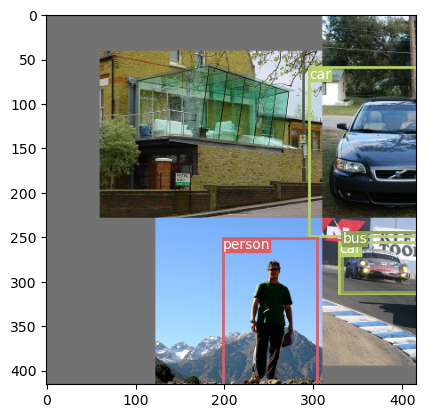

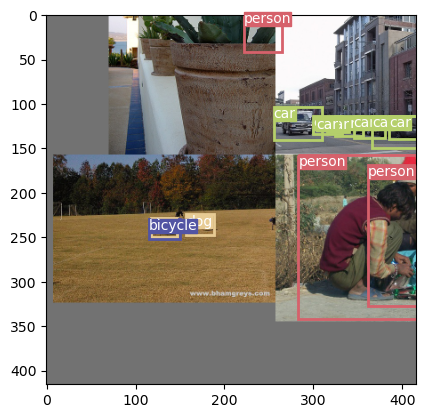

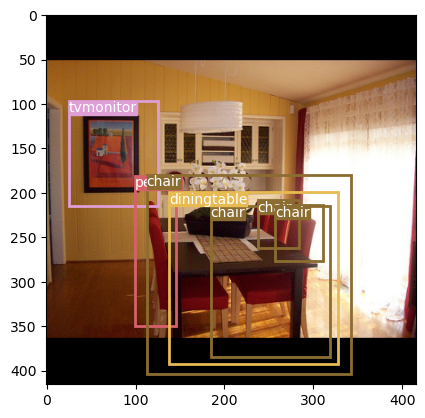

Validation: 0it [00:00, ?it/s]

Epoch: 36, Train Loss: 5.2098


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 81.260178%
No obj accuracy is: 98.028481%
Obj accuracy is: 72.794762%
Creating Checkpoint..


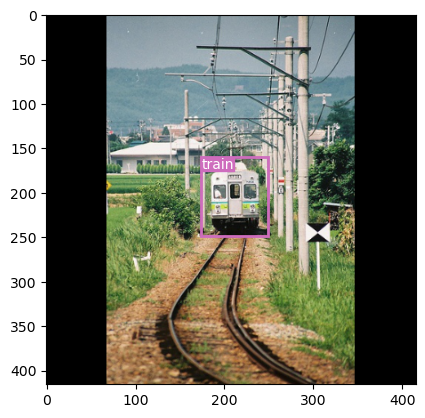

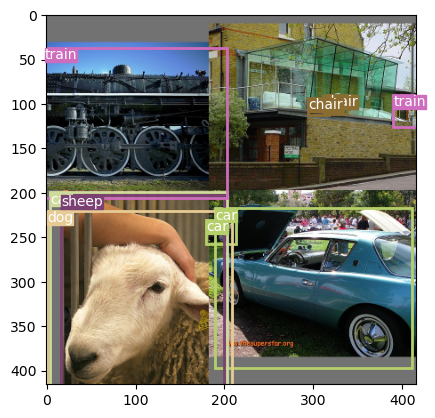

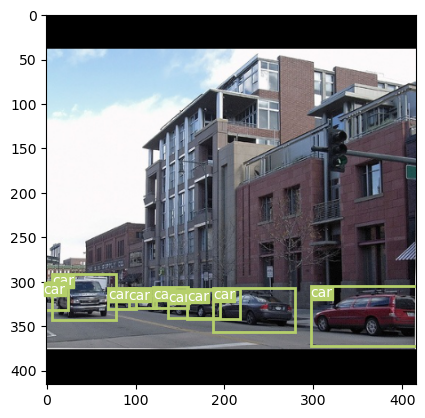

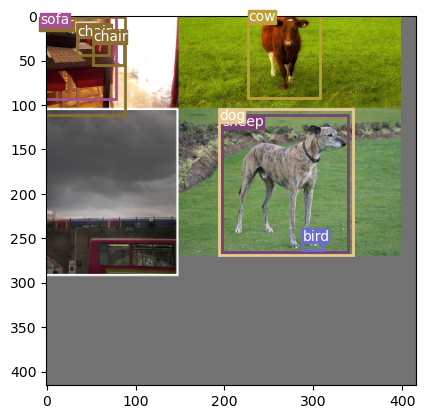

Validation: 0it [00:00, ?it/s]

Epoch: 37, Train Loss: 5.9077


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 81.817833%
No obj accuracy is: 97.949951%
Obj accuracy is: 72.266975%
Creating Checkpoint..


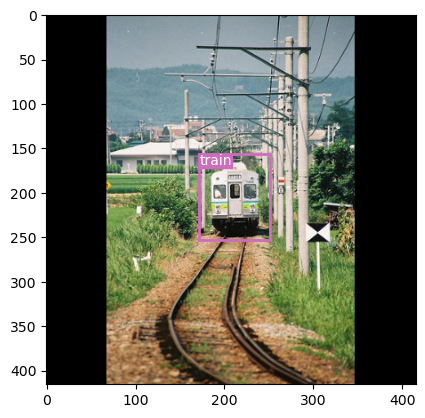

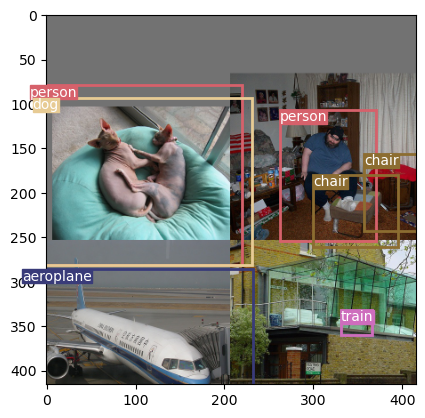

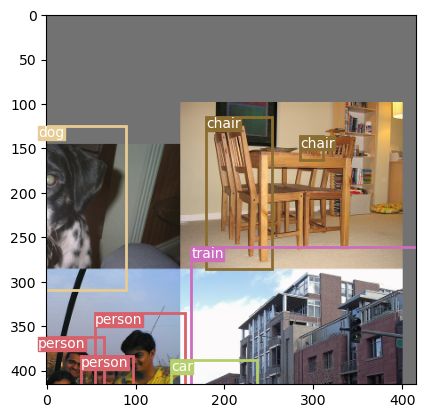

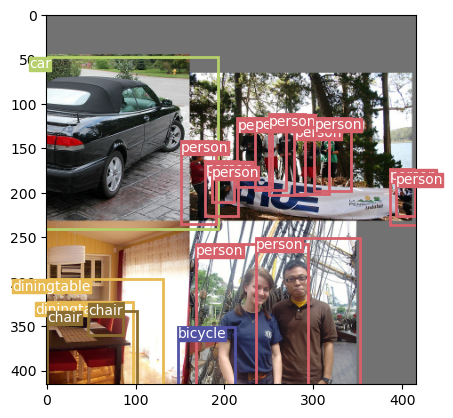

Validation: 0it [00:00, ?it/s]

Epoch: 38, Train Loss: 3.7546


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 82.492821%
No obj accuracy is: 97.944115%
Obj accuracy is: 73.975792%
Creating Checkpoint..


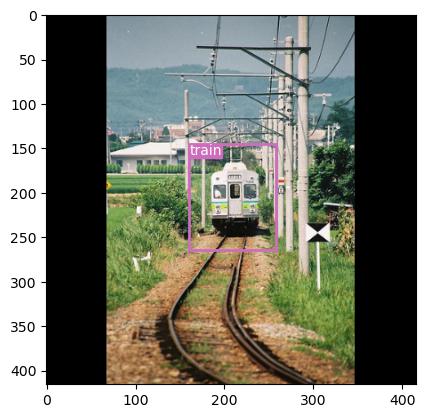

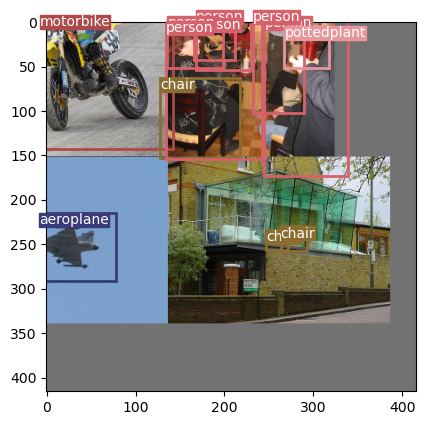

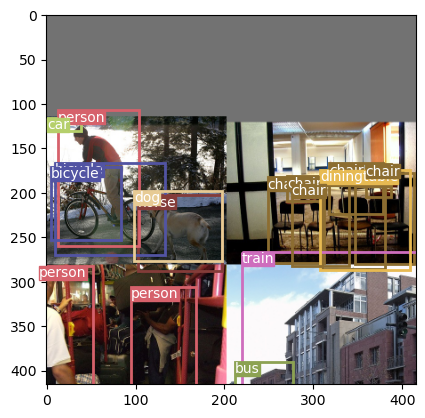

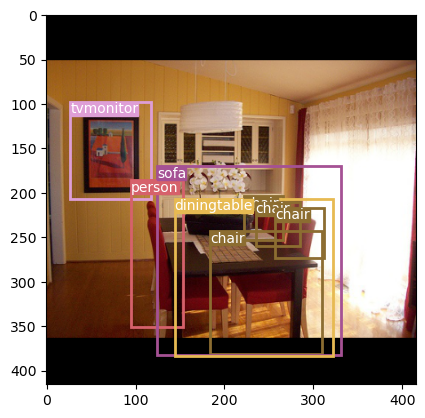

Validation: 0it [00:00, ?it/s]

Epoch: 39, Train Loss: 6.3506


  0%|          | 0/1035 [00:00<?, ?it/s]

Class accuracy is: 82.635735%
No obj accuracy is: 97.875778%
Obj accuracy is: 74.594704%
Creating Checkpoint..


  0%|          | 0/310 [00:00<?, ?it/s]

MAP: 0.2576926052570343


`Trainer.fit` stopped: `max_epochs=40` reached.


In [5]:
trainer.fit(model, train_dataloaders=train_loader, val_dataloaders=test_loader)
#             ckpt_path="/ERAv1/session13_assignment/lightning_logs/version18/checkpoints/epoch=0-step=1035.ckpt")

In [6]:
torch.save(trainer.model.state_dict(), 'stat_dict_multiscale_s13Model.pth')

In [7]:
torch.save(trainer.model, 'multi_scale_s13Model.pth')

In [8]:
# start tensorboard
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
